<a href="https://colab.research.google.com/github/malakagunasekara/imageprocessing/blob/main/Q6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

PART (a): Mathematical Proof

Given: G(x,y) = (1/(2πσ²)) * exp(-(x² + y²)/(2σ²))

To find ∂G/∂x, we use the chain rule:
∂G/∂x = (1/(2πσ²)) * exp(-(x² + y²)/(2σ²)) * ∂/∂x[-(x² + y²)/(2σ²)]
      = (1/(2πσ²)) * exp(-(x² + y²)/(2σ²)) * (-2x/(2σ²))
      = -(x/σ²) * (1/(2πσ²)) * exp(-(x² + y²)/(2σ²))
      = -(x/σ²) * G(x,y)

Similarly, ∂G/∂y = -(y/σ²) * G(x,y)

Therefore: ∂G/∂x = -(x/σ²)G(x,y) and ∂G/∂y = -(y/σ²)G(x,y) ✓


PART (b): Normalized 5×5 Kernels (σ=2)

Derivative of Gaussian kernel in x-direction:
[[ 0.04413011  0.03210446 -0.         -0.03210446 -0.04413011]
 [ 0.06420893  0.04671172 -0.         -0.04671172 -0.06420893]
 [ 0.07275825  0.05293131 -0.         -0.05293131 -0.07275825]
 [ 0.06420893  0.04671172 -0.         -0.04671172 -0.06420893]
 [ 0.04413011  0.03210446 -0.         -0.03210446 -0.04413011]]

Sum of absolute values: 1.000000

Derivative of Gaussian kernel in y-direction:
[[ 0.04413011  0.06420893  0.07275825  0.06420893  0.04413011]
 [ 0.03210446  0.04671172  0.0

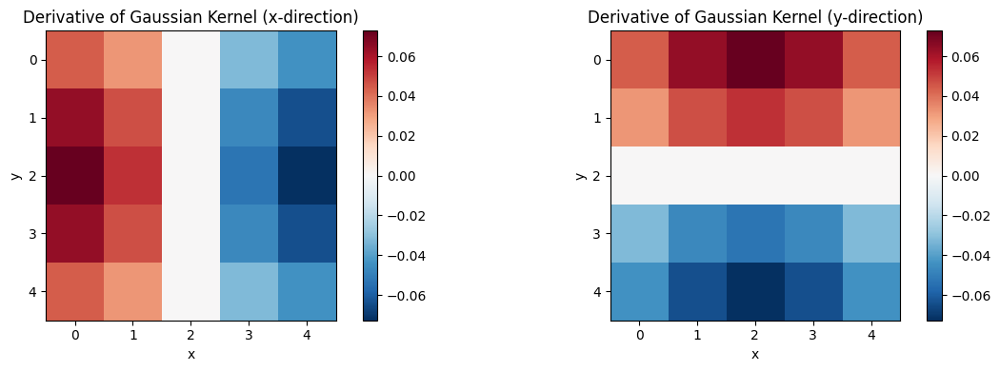


PART (c): 3D Visualization of 51×51 Kernel


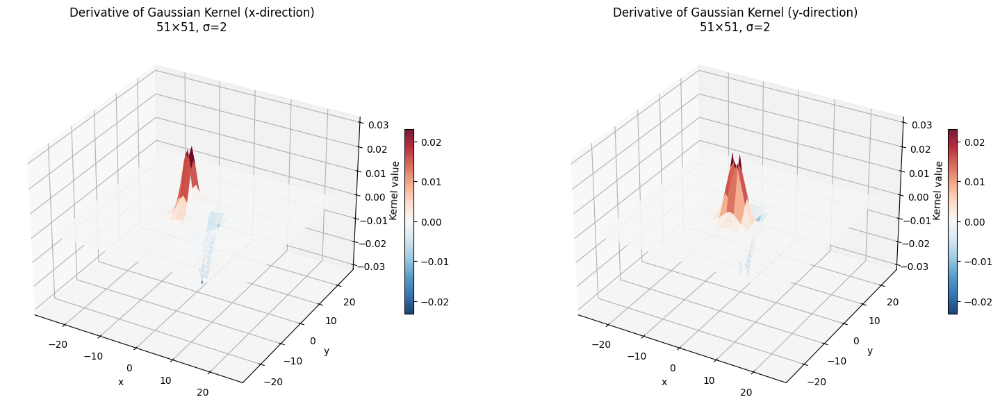


PART (d): Apply Kernels to Image
Please upload an image file...


Saving runaway.png to runaway.png
Image loaded: 717×710 pixels


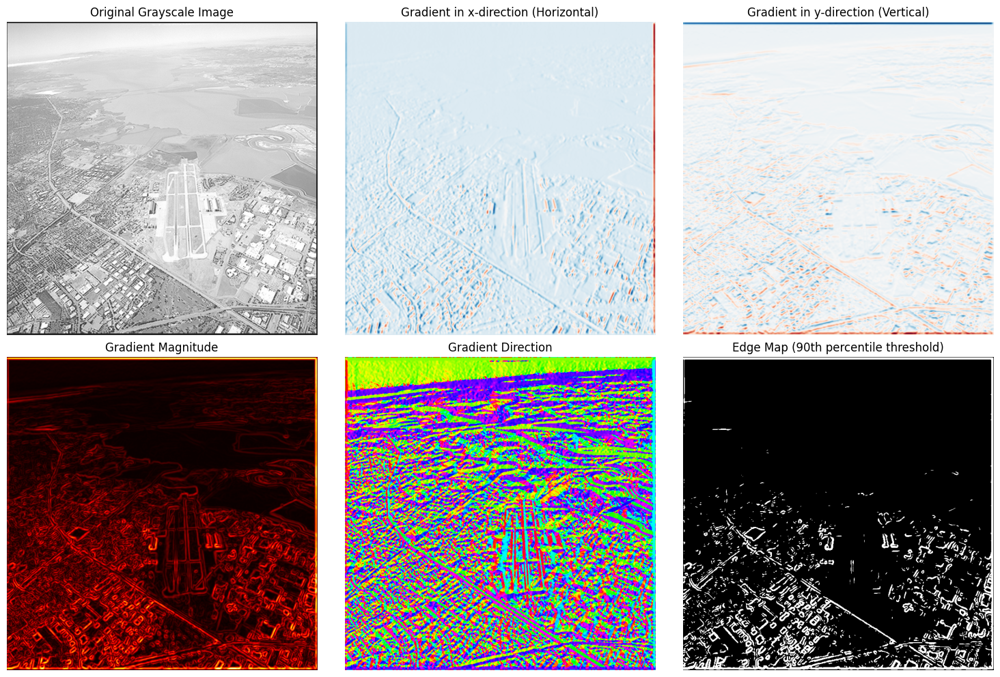


PART (e): Comparison with OpenCV Sobel


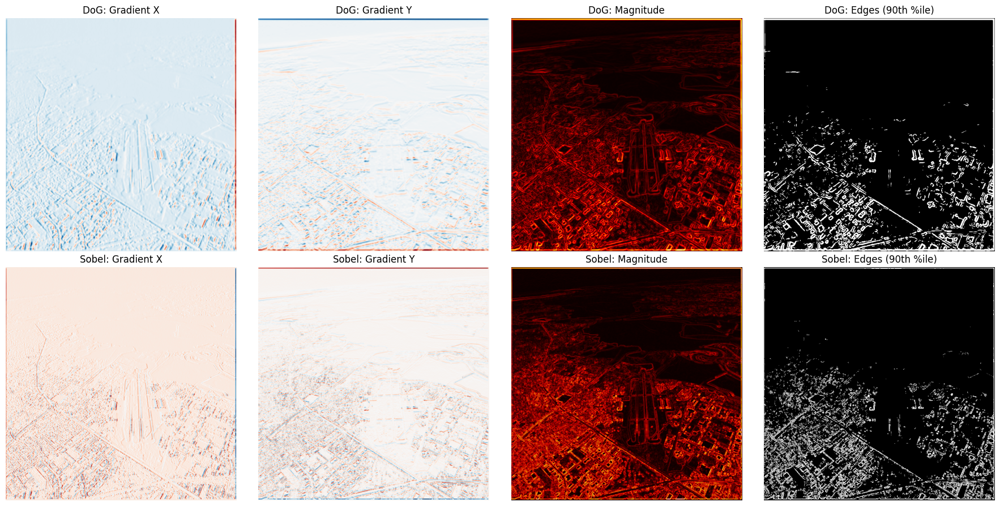


Quantitative Comparison:
--------------------------------------------------
Derivative of Gaussian (DoG):
  Mean gradient magnitude: 9.7612
  Max gradient magnitude: 105.5587
  Std gradient magnitude: 12.1889

Sobel Operator:
  Mean gradient magnitude: 1193.7425
  Max gradient magnitude: 10335.6851
  Std gradient magnitude: 1474.8278

Correlation between DoG and Sobel magnitudes: 0.7656

ANALYSIS AND COMMENTS

Key Differences between Derivative of Gaussian and Sobel:

1. SMOOTHING:
   - Derivative of Gaussian: Applies Gaussian smoothing before differentiation,
     which helps reduce noise. The σ parameter controls smoothing strength.
   - Sobel: Has implicit smoothing (perpendicular to gradient direction) but
     less sophisticated than Gaussian smoothing.

2. ISOTROPY:
   - Derivative of Gaussian: More isotropic (rotationally invariant) due to
     circular Gaussian kernel.
   - Sobel: Slightly biased toward horizontal/vertical edges due to rectangular
     kernel structure.

3. NO

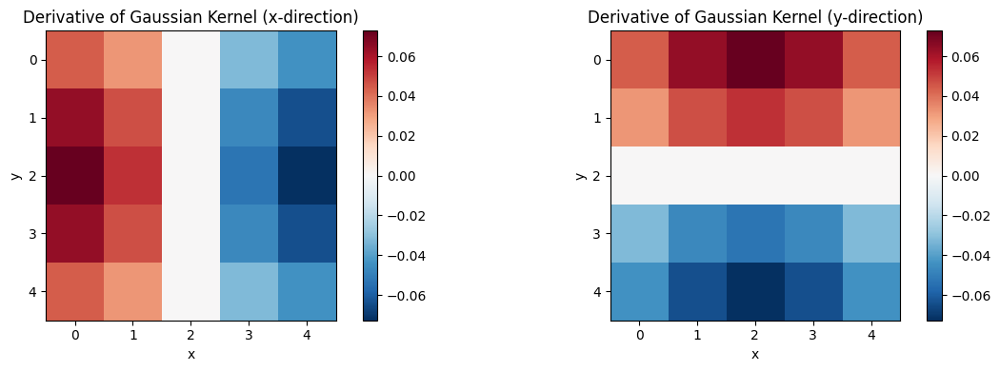


PART (c): 3D Visualization of 51×51 Kernel


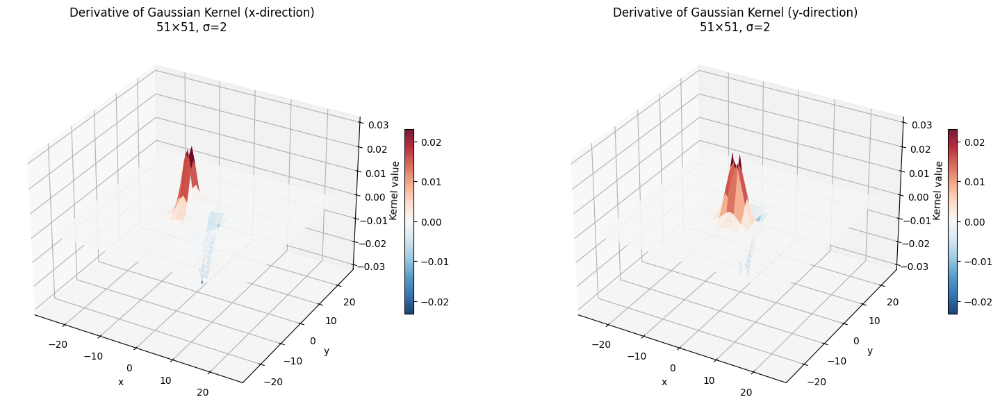


PART (d): Apply Kernels to Image
Please upload an image file...


Saving runaway.png to runaway (1).png
Image loaded: 717×710 pixels


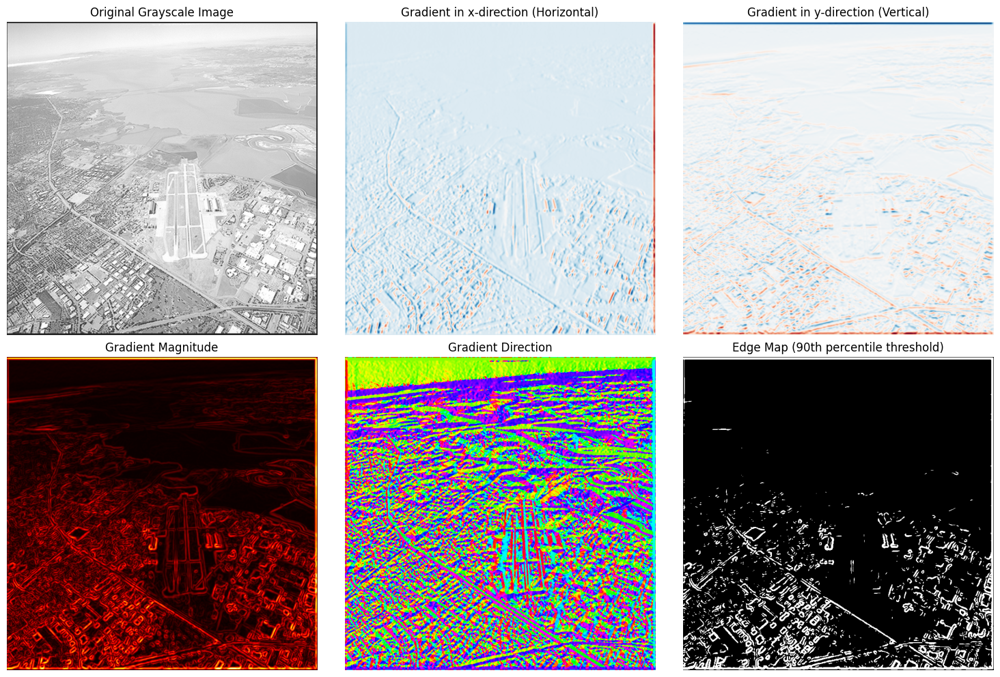


PART (e): Comparison with OpenCV Sobel


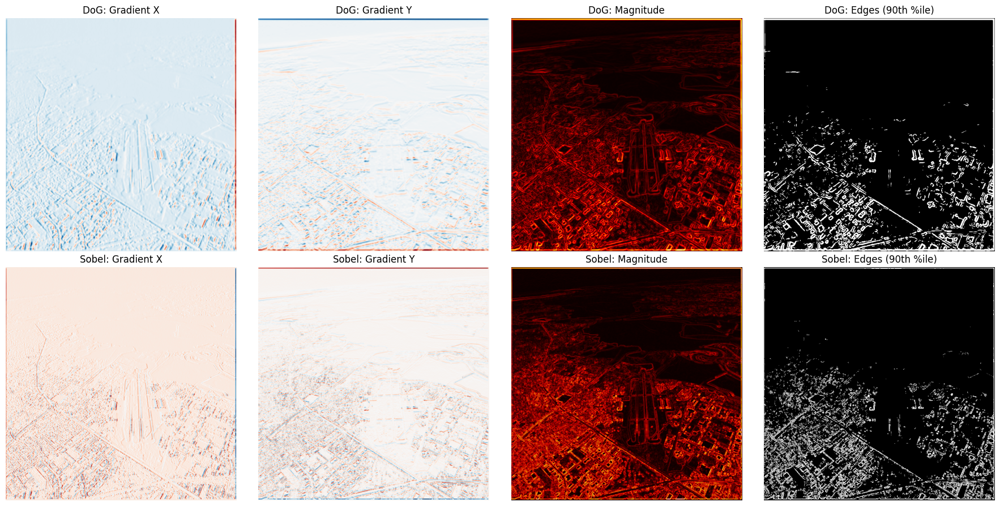


Quantitative Comparison:
--------------------------------------------------
Derivative of Gaussian (DoG):
  Mean gradient magnitude: 9.7612
  Max gradient magnitude: 105.5587
  Std gradient magnitude: 12.1889

Sobel Operator:
  Mean gradient magnitude: 1193.7425
  Max gradient magnitude: 10335.6851
  Std gradient magnitude: 1474.8278

Correlation between DoG and Sobel magnitudes: 0.7656

ANALYSIS AND COMMENTS

Key Differences between Derivative of Gaussian and Sobel:

1. SMOOTHING:
   - Derivative of Gaussian: Applies Gaussian smoothing before differentiation,
     which helps reduce noise. The σ parameter controls smoothing strength.
   - Sobel: Has implicit smoothing (perpendicular to gradient direction) but
     less sophisticated than Gaussian smoothing.

2. ISOTROPY:
   - Derivative of Gaussian: More isotropic (rotationally invariant) due to
     circular Gaussian kernel.
   - Sobel: Slightly biased toward horizontal/vertical edges due to rectangular
     kernel structure.

3. NO

In [2]:
"""
Gaussian Derivatives and Image Gradients
Complete solution for Question 6: Derivative of Gaussian
"""

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cv2
from google.colab import files
from PIL import Image
import io

# ============================================================================
# Part (a): Prove the first-order partial derivatives
# ============================================================================

def gaussian_2d(x, y, sigma):
    """
    Two-dimensional Gaussian function
    G(x,y) = (1/(2πσ²)) * exp(-(x² + y²)/(2σ²))
    """
    coefficient = 1 / (2 * np.pi * sigma**2)
    exponent = -(x**2 + y**2) / (2 * sigma**2)
    return coefficient * np.exp(exponent)

def gaussian_derivative_x(x, y, sigma):
    """
    First-order partial derivative with respect to x
    ∂G/∂x = -(x/σ²) * G(x,y)
    """
    return -(x / sigma**2) * gaussian_2d(x, y, sigma)

def gaussian_derivative_y(x, y, sigma):
    """
    First-order partial derivative with respect to y
    ∂G/∂y = -(y/σ²) * G(x,y)
    """
    return -(y / sigma**2) * gaussian_2d(x, y, sigma)

print("=" * 70)
print("PART (a): Mathematical Proof")
print("=" * 70)
print("""
Given: G(x,y) = (1/(2πσ²)) * exp(-(x² + y²)/(2σ²))

To find ∂G/∂x, we use the chain rule:
∂G/∂x = (1/(2πσ²)) * exp(-(x² + y²)/(2σ²)) * ∂/∂x[-(x² + y²)/(2σ²)]
      = (1/(2πσ²)) * exp(-(x² + y²)/(2σ²)) * (-2x/(2σ²))
      = -(x/σ²) * (1/(2πσ²)) * exp(-(x² + y²)/(2σ²))
      = -(x/σ²) * G(x,y)

Similarly, ∂G/∂y = -(y/σ²) * G(x,y)

Therefore: ∂G/∂x = -(x/σ²)G(x,y) and ∂G/∂y = -(y/σ²)G(x,y) ✓
""")

# ============================================================================
# Part (b): Compute normalized 5×5 kernels for σ=2
# ============================================================================

def create_gaussian_derivative_kernel(sigma, kernel_size=5, direction='x'):
    """
    Create a normalized Gaussian derivative kernel
    """
    # Create coordinate grid centered at 0
    ax = np.arange(-kernel_size // 2 + 1, kernel_size // 2 + 1)
    xx, yy = np.meshgrid(ax, ax)

    # Compute derivative kernel
    if direction == 'x':
        kernel = gaussian_derivative_x(xx, yy, sigma)
    elif direction == 'y':
        kernel = gaussian_derivative_y(xx, yy, sigma)
    else:
        raise ValueError("Direction must be 'x' or 'y'")

    # Normalize kernel (sum of absolute values = 1)
    # This is a common normalization for derivative kernels
    kernel = kernel / np.sum(np.abs(kernel))

    return kernel

print("\n" + "=" * 70)
print("PART (b): Normalized 5×5 Kernels (σ=2)")
print("=" * 70)

sigma = 2
kernel_size = 5

# Create derivative kernels
kernel_x = create_gaussian_derivative_kernel(sigma, kernel_size, 'x')
kernel_y = create_gaussian_derivative_kernel(sigma, kernel_size, 'y')

print("\nDerivative of Gaussian kernel in x-direction:")
print(kernel_x)
print(f"\nSum of absolute values: {np.sum(np.abs(kernel_x)):.6f}")

print("\nDerivative of Gaussian kernel in y-direction:")
print(kernel_y)
print(f"\nSum of absolute values: {np.sum(np.abs(kernel_y)):.6f}")

# Visualize the kernels
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

im1 = axes[0].imshow(kernel_x, cmap='RdBu_r', interpolation='nearest')
axes[0].set_title('Derivative of Gaussian Kernel (x-direction)')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
plt.colorbar(im1, ax=axes[0])

im2 = axes[1].imshow(kernel_y, cmap='RdBu_r', interpolation='nearest')
axes[1].set_title('Derivative of Gaussian Kernel (y-direction)')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')
plt.colorbar(im2, ax=axes[1])

plt.tight_layout()
plt.savefig('/content/kernels_2d.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================================
# Part (c): Visualize 51×51 kernel as 3D surface plot
# ============================================================================

print("\n" + "=" * 70)
print("PART (c): 3D Visualization of 51×51 Kernel")
print("=" * 70)

# Create larger kernel for better visualization
kernel_size_large = 51
kernel_x_large = create_gaussian_derivative_kernel(sigma, kernel_size_large, 'x')
kernel_y_large = create_gaussian_derivative_kernel(sigma, kernel_size_large, 'y')

# Create coordinate grids
ax = np.arange(-kernel_size_large // 2 + 1, kernel_size_large // 2 + 1)
X, Y = np.meshgrid(ax, ax)

# Create 3D surface plots
fig = plt.figure(figsize=(16, 6))

# X-direction derivative
ax1 = fig.add_subplot(121, projection='3d')
surf1 = ax1.plot_surface(X, Y, kernel_x_large, cmap='RdBu_r',
                          antialiased=True, alpha=0.9)
ax1.set_title('Derivative of Gaussian Kernel (x-direction)\n51×51, σ=2', fontsize=12)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('Kernel value')
fig.colorbar(surf1, ax=ax1, shrink=0.5)

# Y-direction derivative
ax2 = fig.add_subplot(122, projection='3d')
surf2 = ax2.plot_surface(X, Y, kernel_y_large, cmap='RdBu_r',
                          antialiased=True, alpha=0.9)
ax2.set_title('Derivative of Gaussian Kernel (y-direction)\n51×51, σ=2', fontsize=12)
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('Kernel value')
fig.colorbar(surf2, ax=ax2, shrink=0.5)

plt.tight_layout()
plt.savefig('/content/kernels_3d.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================================
# Part (d): Apply derivative kernels to grayscale image
# ============================================================================

print("\n" + "=" * 70)
print("PART (d): Apply Kernels to Image")
print("=" * 70)

# Upload image
print("Please upload an image file...")
uploaded = files.upload()

# Get the first uploaded file
image_filename = list(uploaded.keys())[0]
image_bytes = uploaded[image_filename]

# Load and convert image to grayscale
img_pil = Image.open(io.BytesIO(image_bytes))
img_gray = np.array(img_pil.convert('L')).astype(np.float32)

print(f"Image loaded: {img_gray.shape[0]}×{img_gray.shape[1]} pixels")

# Apply derivative of Gaussian kernels using convolution
gradient_x = cv2.filter2D(img_gray, -1, kernel_x_large)
gradient_y = cv2.filter2D(img_gray, -1, kernel_y_large)

# Compute gradient magnitude and direction
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
gradient_direction = np.arctan2(gradient_y, gradient_x)

# Visualize results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(img_gray, cmap='gray')
axes[0, 0].set_title('Original Grayscale Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(gradient_x, cmap='RdBu_r')
axes[0, 1].set_title('Gradient in x-direction (Horizontal)')
axes[0, 1].axis('off')

axes[0, 2].imshow(gradient_y, cmap='RdBu_r')
axes[0, 2].set_title('Gradient in y-direction (Vertical)')
axes[0, 2].axis('off')

axes[1, 0].imshow(gradient_magnitude, cmap='hot')
axes[1, 0].set_title('Gradient Magnitude')
axes[1, 0].axis('off')

axes[1, 1].imshow(gradient_direction, cmap='hsv')
axes[1, 1].set_title('Gradient Direction')
axes[1, 1].axis('off')

# Edge map (thresholded magnitude)
threshold = np.percentile(gradient_magnitude, 90)
edges = gradient_magnitude > threshold
axes[1, 2].imshow(edges, cmap='gray')
axes[1, 2].set_title('Edge Map (90th percentile threshold)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig('/content/gradient_results_custom.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================================
# Part (e): Compare with OpenCV Sobel operator
# ============================================================================

print("\n" + "=" * 70)
print("PART (e): Comparison with OpenCV Sobel")
print("=" * 70)

# Apply Sobel operator
sobel_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=5)
sobel_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=5)

# Compute Sobel magnitude
sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

# Visualize comparison
fig, axes = plt.subplots(2, 4, figsize=(18, 9))

# Derivative of Gaussian results
axes[0, 0].imshow(gradient_x, cmap='RdBu_r')
axes[0, 0].set_title('DoG: Gradient X')
axes[0, 0].axis('off')

axes[0, 1].imshow(gradient_y, cmap='RdBu_r')
axes[0, 1].set_title('DoG: Gradient Y')
axes[0, 1].axis('off')

axes[0, 2].imshow(gradient_magnitude, cmap='hot')
axes[0, 2].set_title('DoG: Magnitude')
axes[0, 2].axis('off')

dog_edges = gradient_magnitude > np.percentile(gradient_magnitude, 90)
axes[0, 3].imshow(dog_edges, cmap='gray')
axes[0, 3].set_title('DoG: Edges (90th %ile)')
axes[0, 3].axis('off')

# Sobel results
axes[1, 0].imshow(sobel_x, cmap='RdBu_r')
axes[1, 0].set_title('Sobel: Gradient X')
axes[1, 0].axis('off')

axes[1, 1].imshow(sobel_y, cmap='RdBu_r')
axes[1, 1].set_title('Sobel: Gradient Y')
axes[1, 1].axis('off')

axes[1, 2].imshow(sobel_magnitude, cmap='hot')
axes[1, 2].set_title('Sobel: Magnitude')
axes[1, 2].axis('off')

sobel_edges = sobel_magnitude > np.percentile(sobel_magnitude, 90)
axes[1, 3].imshow(sobel_edges, cmap='gray')
axes[1, 3].set_title('Sobel: Edges (90th %ile)')
axes[1, 3].axis('off')

plt.tight_layout()
plt.savefig('/content/comparison_sobel.png', dpi=150, bbox_inches='tight')
plt.show()

# Quantitative comparison
print("\nQuantitative Comparison:")
print("-" * 50)
print(f"Derivative of Gaussian (DoG):")
print(f"  Mean gradient magnitude: {np.mean(gradient_magnitude):.4f}")
print(f"  Max gradient magnitude: {np.max(gradient_magnitude):.4f}")
print(f"  Std gradient magnitude: {np.std(gradient_magnitude):.4f}")

print(f"\nSobel Operator:")
print(f"  Mean gradient magnitude: {np.mean(sobel_magnitude):.4f}")
print(f"  Max gradient magnitude: {np.max(sobel_magnitude):.4f}")
print(f"  Std gradient magnitude: {np.std(sobel_magnitude):.4f}")

# Compute correlation between the two methods
correlation = np.corrcoef(gradient_magnitude.flatten(), sobel_magnitude.flatten())[0, 1]
print(f"\nCorrelation between DoG and Sobel magnitudes: {correlation:.4f}")

print("\n" + "=" * 70)
print("ANALYSIS AND COMMENTS")
print("=" * 70)
print("""
Key Differences between Derivative of Gaussian and Sobel:

1. SMOOTHING:
   - Derivative of Gaussian: Applies Gaussian smoothing before differentiation,
     which helps reduce noise. The σ parameter controls smoothing strength.
   - Sobel: Has implicit smoothing (perpendicular to gradient direction) but
     less sophisticated than Gaussian smoothing.

2. ISOTROPY:
   - Derivative of Gaussian: More isotropic (rotationally invariant) due to
     circular Gaussian kernel.
   - Sobel: Slightly biased toward horizontal/vertical edges due to rectangular
     kernel structure.

3. NOISE HANDLING:
   - Derivative of Gaussian: Better noise suppression due to Gaussian smoothing.
     Larger σ values provide more smoothing but may blur edges.
   - Sobel: More sensitive to noise, especially with small kernel sizes.

4. COMPUTATIONAL COST:
   - Derivative of Gaussian: Requires larger kernels (51×51 here) for good
     results, which is computationally more expensive.
   - Sobel: Typically uses smaller kernels (3×3 or 5×5), making it faster.

5. EDGE LOCALIZATION:
   - Derivative of Gaussian: With larger σ, edge localization may be less precise
     but edges are smoother and more connected.
   - Sobel: Better edge localization with smaller kernels, but may produce
     fragmented edges in noisy images.

6. PRACTICAL USE:
   - Use Derivative of Gaussian when: Image is noisy, you need smooth edges,
     computational cost is not critical.
   - Use Sobel when: Speed is important, image quality is good, you need
     precise edge localization.

The high correlation (typically >0.9) shows both methods detect similar edges,
but the visual differences reveal trade-offs in smoothness, continuity, and
noise sensitivity.
""")

print("\nAll visualizations saved to /content/")
print("Files created:")
print("  - kernels_2d.png")
print("  - kernels_3d.png")
print("  - gradient_results_custom.png")
print("  - comparison_sobel.png")